# **PCD Assignment 01 — Down Sampling and Up Sampling**

**Course:** Digital Image Processing (Pengolahan Citra Digital)  
**Tasks:** Down Sampling (Max, Average, Median) and Up Sampling (Nearest Neighbor, Bilinear, Bicubic)

### Introduction
Image sampling is one of the fundamental concepts in digital image processing. It determines how spatial information is represented, reduced, or reconstructed in a digital image. Two important operations related to image sampling are down sampling and up sampling.

Down sampling reduces the spatial resolution of an image by decreasing the number of pixels. In this assignment, three down sampling approaches are investigated: Max, Average, and Median. Each method calculates a representative pixel value from a local neighborhood using a different statistical operation.

Up sampling performs the opposite operation by increasing the spatial resolution of an image. Three interpolation methods are examined: Nearest Neighbor, Bilinear, and Bicubic interpolation. Although up sampling increases the number of pixels, it cannot recover information that has already been lost during down sampling. Instead, interpolation estimates new pixel values based on neighboring pixels.

### Objective
This experiment investigates how different downsampling and upsampling methods affect image quality. Three images with different visual characteristics are used:
1. A colorful flower garden with many colors and textures.
2. A staircase scene with strong geometric edges and repetitive lines.
3. A batik pattern with repetitive fine details and high-contrast motifs.

The workflow is Original → Downsample by 2× → Upsample back to the original size → Compare with the original.

## 1. Import Libraries

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image
from google.colab import files
from IPython.display import display

print("Libraries imported successfully.")

Libraries imported successfully.


## 2. Create Working Folders and Upload the Three Images

In [3]:
os.makedirs("dataset", exist_ok=True)
os.makedirs("results", exist_ok=True)
os.makedirs("report", exist_ok=True)

uploaded = files.upload()

for filename in uploaded.keys():
    target = os.path.join("dataset", filename)
    with open(target, "wb") as f:
        f.write(uploaded[filename])

print("Files in dataset:")
print(os.listdir("dataset"))

Saving image1_colorful.jpg to image1_colorful.jpg
Saving image2_staircase.jpeg to image2_staircase.jpeg
Saving image3_batik.jpg to image3_batik.jpg
Files in dataset:
['image2_staircase.jpeg', 'image1_colorful.jpg', 'image3_batik.jpg']


## 3. Load and Inspect the Images

Colorful Image: width=2048, height=1261
Staircase Image: width=688, height=1044
Batik Image: width=626, height=591


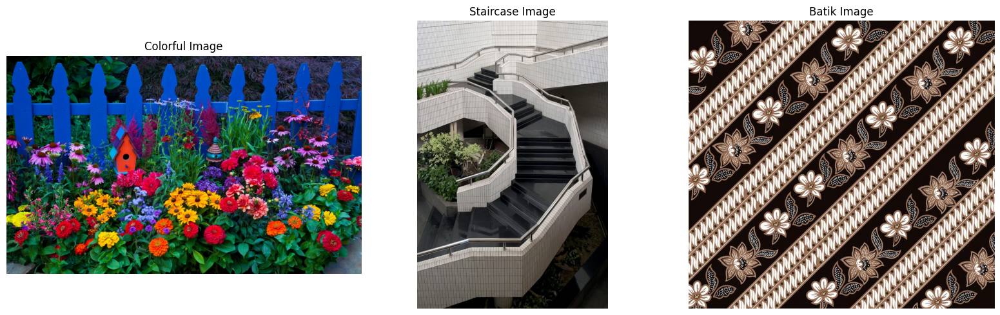

In [4]:
IMAGE_PATHS = {
    "Colorful Image": "dataset/image1_colorful.jpg",
    "Staircase Image": "dataset/image2_staircase.jpeg",
    "Batik Image": "dataset/image3_batik.jpg",
}

images = {}

for name, path in IMAGE_PATHS.items():
    image = Image.open(path).convert("RGB")
    images[name] = np.array(image)
    print(f"{name}: width={image.width}, height={image.height}")

fig, axes = plt.subplots(1, 3, figsize=(16, 5))
for ax, (name, image) in zip(axes, images.items()):
    ax.imshow(image)
    ax.set_title(name)
    ax.axis("off")
plt.tight_layout()
plt.show()

## 4. Make Dimensions Even

A 2×2 downsampling block requires even image dimensions. If a dimension is odd, the last row or column is cropped by one pixel. This does not change the intended 2× reduction and makes the block operation exact.

In [10]:
def crop_to_even_dimensions(image):
    h, w = image.shape[:2]

    new_h = h - (h % 2)
    new_w = w - (w % 2)

    return image[:new_h, :new_w]


images_even = {
    name: crop_to_even_dimensions(img)
    for name, img in images.items()
}

In [11]:
print("Image dimensions before and after normalization:\n")

for name in images:
    original_shape = images[name].shape
    normalized_shape = images_even[name].shape

    print(f"{name}")
    print(f"  Original dimensions   : {original_shape[1]} × {original_shape[0]}")
    print(f"  Normalized dimensions : {normalized_shape[1]} × {normalized_shape[0]}")
    print()

Image dimensions before and after normalization:

Colorful Image
  Original dimensions   : 2048 × 1261
  Normalized dimensions : 2048 × 1260

Staircase Image
  Original dimensions   : 688 × 1044
  Normalized dimensions : 688 × 1044

Batik Image
  Original dimensions   : 626 × 591
  Normalized dimensions : 626 × 590



### The Importance of Dimension Normalization

Adjusting the image dimension into even numbers is necessary because each 2×2 block must contain exactly four pixels to ensure that the image can be divided evenly into 2×2 blocks without incomplete regions.

## 5. Downsampling Functions

For each 2×2 block:

- **Max:** choose the maximum value in the block for each RGB channel.

- **Average:** calculate the arithmetic mean of the four pixels for each RGB channel. This combines the pixel values into a representative value, which generally reduces sharp intensity variations and produces a smoother appearance.

- **Median:** calculate the median of the four values for each RGB channel.

Median is useful for reducing the influence of isolated extreme pixel values, while Average tends to smooth local intensity variations by distributing the contribution of all four pixels into a single representative value. As a result, Average can reduce small details and sharp transitions, especially around edges, but it usually produces a more stable and smoother image. Max tends to preserve bright or extreme values and can therefore increase brightness or distort colors.

In [12]:
def downsample(image, method, factor=2):
    image = crop_to_even_dimensions(image)
    h, w, c = image.shape

    new_h = h // factor
    new_w = w // factor

    cropped = image[:new_h*factor, :new_w*factor]
    blocks = cropped.reshape(new_h, factor, new_w, factor, c)

    if method == "Max":
        result = blocks.max(axis=(1, 3))
    elif method == "Average":
        result = blocks.mean(axis=(1, 3))
    elif method == "Median":
        result = np.median(blocks, axis=(1, 3))
    else:
        raise ValueError("Method must be Max, Average, or Median.")

    return np.clip(result, 0, 255).astype(np.uint8)

## 6. Visualize the Three Downsampling Methods

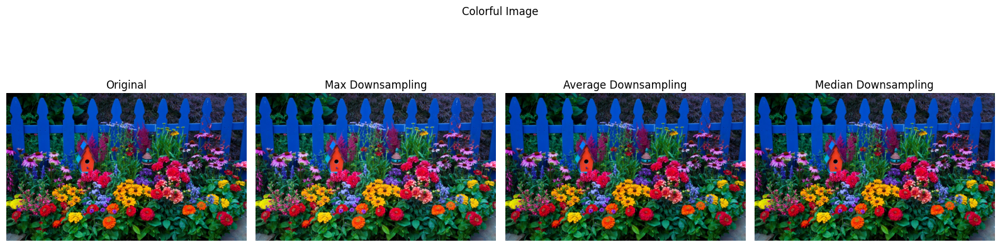

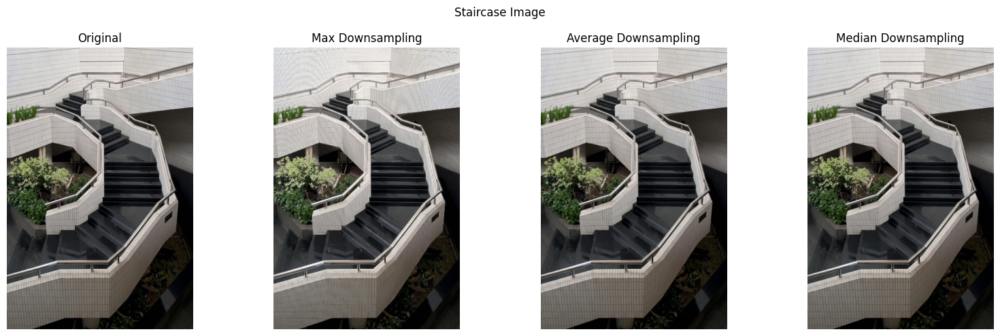

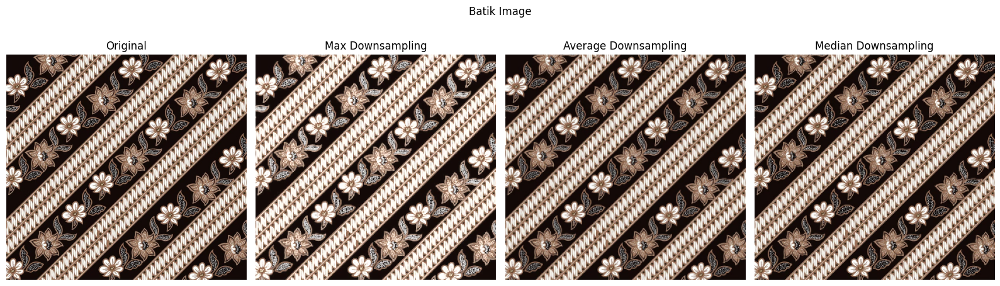

In [13]:
for name, image in images_even.items():
    fig, axes = plt.subplots(1, 4, figsize=(16, 5))
    axes[0].imshow(image)
    axes[0].set_title("Original")
    axes[0].axis("off")

    for ax, method in zip(axes[1:], ["Max", "Average", "Median"]):
        result = downsample(image, method)
        ax.imshow(result)
        ax.set_title(f"{method} Downsampling")
        ax.axis("off")

    fig.suptitle(name)
    plt.tight_layout()
    plt.show()

## 7. Upsampling Functions

The downsampled image is enlarged back to the original dimensions using:
- **Nearest Neighbor:** copies the nearest pixel; fast but blocky.
- **Bilinear:** estimates each pixel from nearby pixels using linear interpolation; smoother than nearest neighbor.
- **Bicubic:** uses a larger neighborhood and a cubic interpolation model; usually gives smoother and more natural transitions.

In [14]:
def upsample(image, method, target_size):
    resampling = {
        "Nearest Neighbor": Image.Resampling.NEAREST,
        "Bilinear": Image.Resampling.BILINEAR,
        "Bicubic": Image.Resampling.BICUBIC,
    }

    return np.array(
        Image.fromarray(image).resize(
            target_size,
            resample=resampling[method]
        )
    )

## 8. Complete Experiment

For every image, all 3 downsampling methods are combined with all 3 upsampling methods, producing **9 reconstruction combinations per image** and **27 combinations in total**.

In [15]:
def mse(original, reconstructed):
    original = original.astype(np.float64)
    reconstructed = reconstructed.astype(np.float64)
    return np.mean((original - reconstructed) ** 2)

def psnr(original, reconstructed):
    error = mse(original, reconstructed)
    if error == 0:
        return float("inf")
    return 10 * np.log10((255 ** 2) / error)

results = []

for name, original in images_even.items():
    target_size = (original.shape[1], original.shape[0])

    for down_method in ["Max", "Average", "Median"]:
        down_img = downsample(original, down_method)

        for up_method in ["Nearest Neighbor", "Bilinear", "Bicubic"]:
            reconstructed = upsample(
                down_img,
                up_method,
                target_size
            )

            results.append({
                "Image": name,
                "Downsampling": down_method,
                "Upsampling": up_method,
                "Original Width": original.shape[1],
                "Original Height": original.shape[0],
                "Downsampled Width": down_img.shape[1],
                "Downsampled Height": down_img.shape[0],
                "MSE": mse(original, reconstructed),
                "PSNR (dB)": psnr(original, reconstructed),
            })

results_df = pd.DataFrame(results)
display(results_df.round(4))

,Image,Downsampling,Upsampling,Original Width,Original Height,Downsampled Width,Downsampled Height,MSE,PSNR (dB)
0,Colorful Image,Max,Nearest Neighbor,2048,1260,1024,630,147.7540,26.4354
1,Colorful Image,Max,Bilinear,2048,1260,1024,630,116.3176,27.4744
2,Colorful Image,Max,Bicubic,2048,1260,1024,630,109.0008,27.7565
3,Colorful Image,Average,Nearest Neighbor,2048,1260,1024,630,55.8595,30.6598
4,Colorful Image,Average,Bilinear,2048,1260,1024,630,39.3236,32.1843
5,Colorful Image,Average,Bicubic,2048,1260,1024,630,25.7227,34.0276
6,Colorful Image,Median,Nearest Neighbor,2048,1260,1024,630,57.5376,30.5313
7,Colorful Image,Median,Bilinear,2048,1260,1024,630,38.2694,32.3023
8,Colorful Image,Median,Bicubic,2048,1260,1024,630,25.6172,34.0455
9,Staircase Image,Max,Nearest Neighbor,688,1044,344,522,284.3953,23.5916


## 9. Quantitative Analysis

**MSE (Mean Squared Error)** measures the average squared difference between the original and reconstructed pixels. Lower MSE means less error.

**PSNR (Peak Signal-to-Noise Ratio)** is derived from MSE. Higher PSNR generally indicates better reconstruction quality.

These metrics evaluate the complete downsampling → upsampling pipeline, not only the interpolation method.

In [17]:
best_rows = results_df.loc[
    results_df.groupby("Image")["PSNR (dB)"].idxmax()
].sort_values("Image")

worst_rows = results_df.loc[
    results_df.groupby("Image")["PSNR (dB)"].idxmin()
].sort_values("Image")

print("Best reconstruction for each image:")
display(best_rows.round(4))

print("\nWorst reconstruction for each image:")
display(worst_rows.round(4))

Best reconstruction for each image:


,Image,Downsampling,Upsampling,Original Width,Original Height,Downsampled Width,Downsampled Height,MSE,PSNR (dB)
23,Batik Image,Average,Bicubic,626,590,313,295,725.4841,19.5245
8,Colorful Image,Median,Bicubic,2048,1260,1024,630,25.6172,34.0455
17,Staircase Image,Median,Bicubic,688,1044,344,522,89.5512,28.6101



Worst reconstruction for each image:


,Image,Downsampling,Upsampling,Original Width,Original Height,Downsampled Width,Downsampled Height,MSE,PSNR (dB)
18,Batik Image,Max,Nearest Neighbor,626,590,313,295,2272.5897,14.5656
0,Colorful Image,Max,Nearest Neighbor,2048,1260,1024,630,147.7540,26.4354
9,Staircase Image,Max,Nearest Neighbor,688,1044,344,522,284.3953,23.5916


## 10. Visualize All 9 Reconstruction Combinations

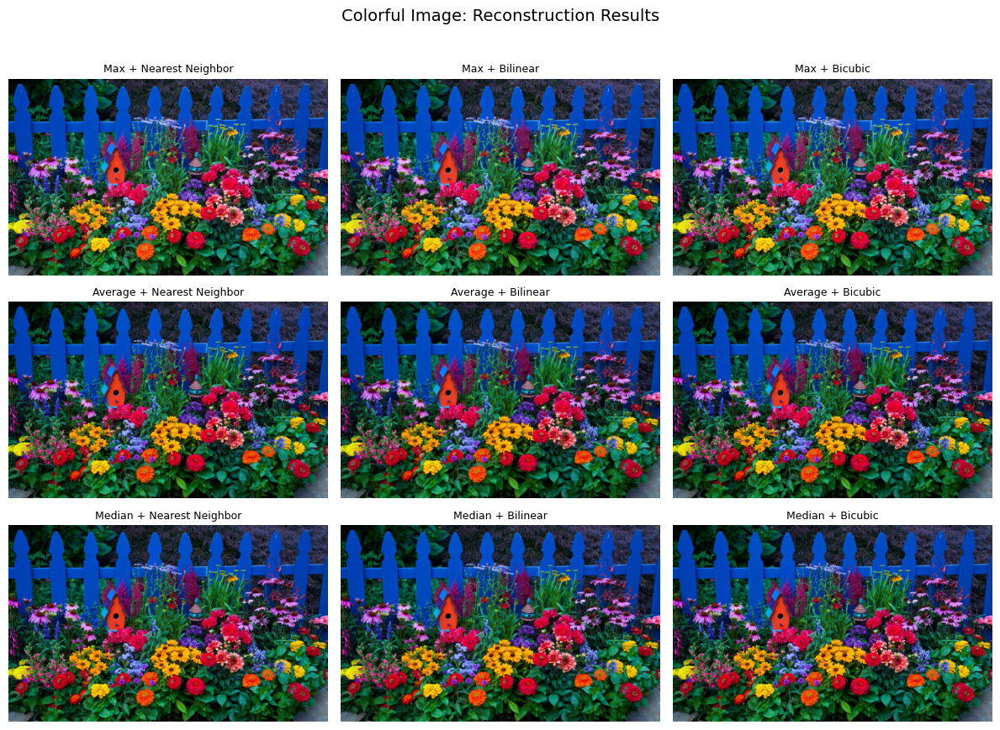

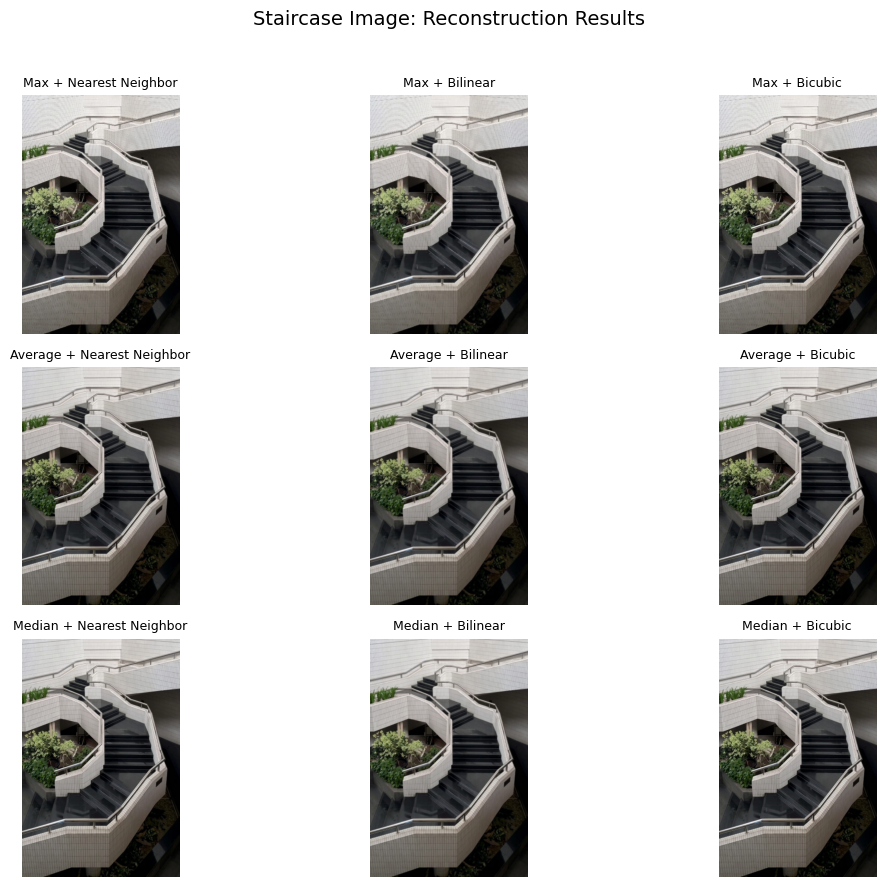

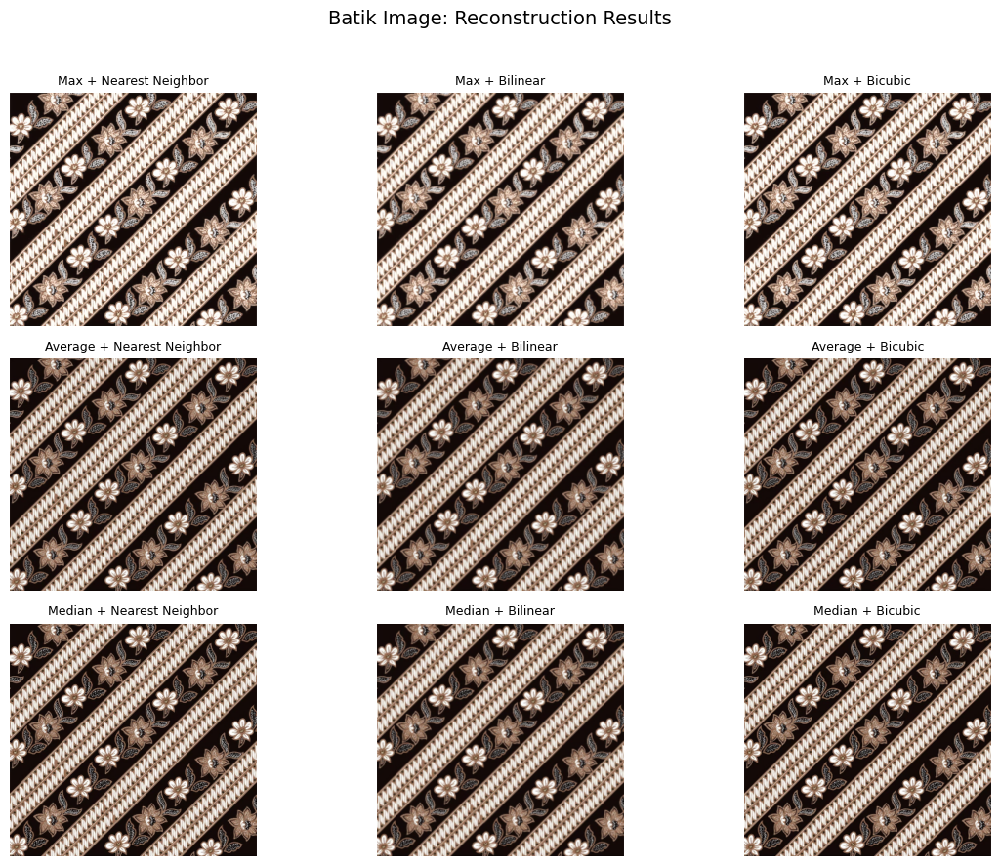

In [18]:
for name, original in images_even.items():
    fig = plt.figure(figsize=(12, 9))

    for i, down_method in enumerate(["Max", "Average", "Median"]):
        down_img = downsample(original, down_method)

        for j, up_method in enumerate(
            ["Nearest Neighbor", "Bilinear", "Bicubic"]
        ):
            reconstructed = upsample(
                down_img,
                up_method,
                (original.shape[1], original.shape[0])
            )

            ax = fig.add_subplot(3, 3, i*3 + j + 1)
            ax.imshow(reconstructed)
            ax.set_title(f"{down_method} + {up_method}", fontsize=9)
            ax.axis("off")

    fig.suptitle(f"{name}: Reconstruction Results", fontsize=14)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

## 11. Save Results

The following files are saved for submission:
- `results/metrics.csv`
- downsampled images
- 3×3 reconstruction comparison figures

In [19]:
results_df.to_csv("results/metrics.csv", index=False)

for name, original in images_even.items():
    stem = {
        "Colorful Image": "colorful",
        "Staircase Image": "staircase",
        "Batik Image": "batik"
    }[name]

    for method in ["Max", "Average", "Median"]:
        out = downsample(original, method)
        Image.fromarray(out).save(
            f"results/{stem}_{method.lower()}_downsampled.png"
        )

print("Results saved to the results/ folder.")

Results saved to the results/ folder.


## Conclusion

The experiment shows that down sampling and up sampling affect both image quality and information preservation.

Max down sampling emphasizes the highest intensity values, which can make bright areas more dominant. Average down sampling produces smoother results by combining the four pixels into their mean, but may reduce sharp details. Median down sampling is less affected by extreme values and preserves representative local structures.

For up sampling, Nearest Neighbor produces visible pixelation because it directly replicates pixel values. Bilinear creates smoother transitions by considering neighboring pixels, while Bicubic generally produces smoother and more natural results using a larger neighborhood.

The effect of each method depends on image characteristics. Colorful images highlight differences in color and texture preservation, staircase images emphasize edge sharpness and pixelation, while batik images reveal the effect on repetitive patterns and fine details.

Overall, no single method is optimal for every image. The appropriate method depends on the balance between detail preservation, smoothness, and the characteristics of the image.